<a href="https://colab.research.google.com/github/DIWEERAPURA/Image-Processing-CV-Projects-and-Deep-Learning-Vision-Tasks/blob/main/Objective_Attractiveness.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Mount Google Drive (optional)
from google.colab import drive
drive.mount('/content/drive')

# Install dependencies
!pip install dlib imutils opencv-python deepface


Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 62.3 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=bdad455785c05921428e8951ae2e93d0081c4f481fec86a212b1bf8ca2a6600e
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire


In [2]:
from google.colab import files
import zipfile
import os

# Upload SCUT-FBP5500.zip
uploaded = files.upload()  # select SCUT-FBP5500.zip

# Unzip into /content/SCUT-FBP5500
with zipfile.ZipFile('SCUT-FBP5500.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/SCUT-FBP5500')


Saving SCUT-FBP5500.zip to SCUT-FBP5500.zip


In [3]:
import os
import shutil

# Define source and destination directories
src_dir = '/content/SCUT-FBP5500/SCUT-FBP5500_v2/Images'
dest_dir = './CM_Faces'   # writable in the current working directory

# Create destination directory if it doesn't exist
os.makedirs(dest_dir, exist_ok=True)

# Iterate over all files in the source directory
count = 0
for filename in os.listdir(src_dir):
    # Filter for Caucasian male faces (filenames start with 'CM')
    if filename.startswith('CM') and filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        shutil.copy(os.path.join(src_dir, filename),
                    os.path.join(dest_dir, filename))
        count += 1

print(f"Copied {count} Caucasian male face images to: {dest_dir}")


Copied 750 Caucasian male face images to: ./CM_Faces


In [5]:
pip install imutils


In [6]:
# Updated Preprocessing Snippet: Ensure `center` is Python ints

import os
import cv2
import dlib
import numpy as np
from imutils import face_utils
from glob import glob

# Initialize detector & predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")

def align_and_normalize(image, landmarks):
    # Extract eye centers
    (lStart, lEnd) = face_utils.FACIAL_LANDMARKS_IDXS["left_eye"]
    (rStart, rEnd) = face_utils.FACIAL_LANDMARKS_IDXS["right_eye"]
    leftEyePts = np.array(landmarks[lStart:lEnd])
    rightEyePts = np.array(landmarks[rStart:rEnd])
    leftEyeCenter = leftEyePts.mean(axis=0)
    rightEyeCenter = rightEyePts.mean(axis=0)

    # Compute angle and scale
    dy = rightEyeCenter[1] - leftEyeCenter[1]
    dx = rightEyeCenter[0] - leftEyeCenter[0]
    angle = np.degrees(np.arctan2(dy, dx))

    # Desired output dimensions
    desiredFaceWidth = 256
    desiredFaceHeight = 256
    desiredLeftEye = (0.35, 0.35)
    desiredRightEyeX = 1.0 - desiredLeftEye[0]

    # Calculate scale factor
    dist = np.sqrt(dx**2 + dy**2)
    desiredDist = (desiredRightEyeX - desiredLeftEye[0]) * desiredFaceWidth
    scale = desiredDist / dist

    # **Ensure center coordinates are Python ints** citeturn0search0turn0search8
    eyesCenterX = int((leftEyeCenter[0] + rightEyeCenter[0]) / 2)
    eyesCenterY = int((leftEyeCenter[1] + rightEyeCenter[1]) / 2)
    eyesCenter = (eyesCenterX, eyesCenterY)

    # Compute transformation matrix
    M = cv2.getRotationMatrix2D(eyesCenter, angle, scale)

    # Update translation
    tX = desiredFaceWidth * 0.5
    tY = desiredFaceHeight * desiredLeftEye[1]
    M[0, 2] += (tX - eyesCenterX)
    M[1, 2] += (tY - eyesCenterY)

    # Apply affine warp and CLAHE
    aligned = cv2.warpAffine(image, M, (desiredFaceWidth, desiredFaceHeight),
                             flags=cv2.INTER_CUBIC)
    ycrcb = cv2.cvtColor(aligned, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    y_eq = clahe.apply(y)
    normalized = cv2.cvtColor(cv2.merge((y_eq, cr, cb)), cv2.COLOR_YCrCb2BGR)

    return normalized

# Example usage on CM_Faces_Preprocessed
src_folder = './CM_Faces'
dst_folder = './CM_Faces_Preprocessed'
os.makedirs(dst_folder, exist_ok=True)

for img_path in glob(os.path.join(src_folder, '*')):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = detector(gray, 1)
    if faces:
        shape = predictor(gray, faces[0])
        landmarks = face_utils.shape_to_np(shape)
        preproc = align_and_normalize(img, landmarks)
        cv2.imwrite(os.path.join(dst_folder, os.path.basename(img_path)), preproc)

print(f"Preprocessed images saved to: {dst_folder}")


Preprocessed images saved to: ./CM_Faces_Preprocessed


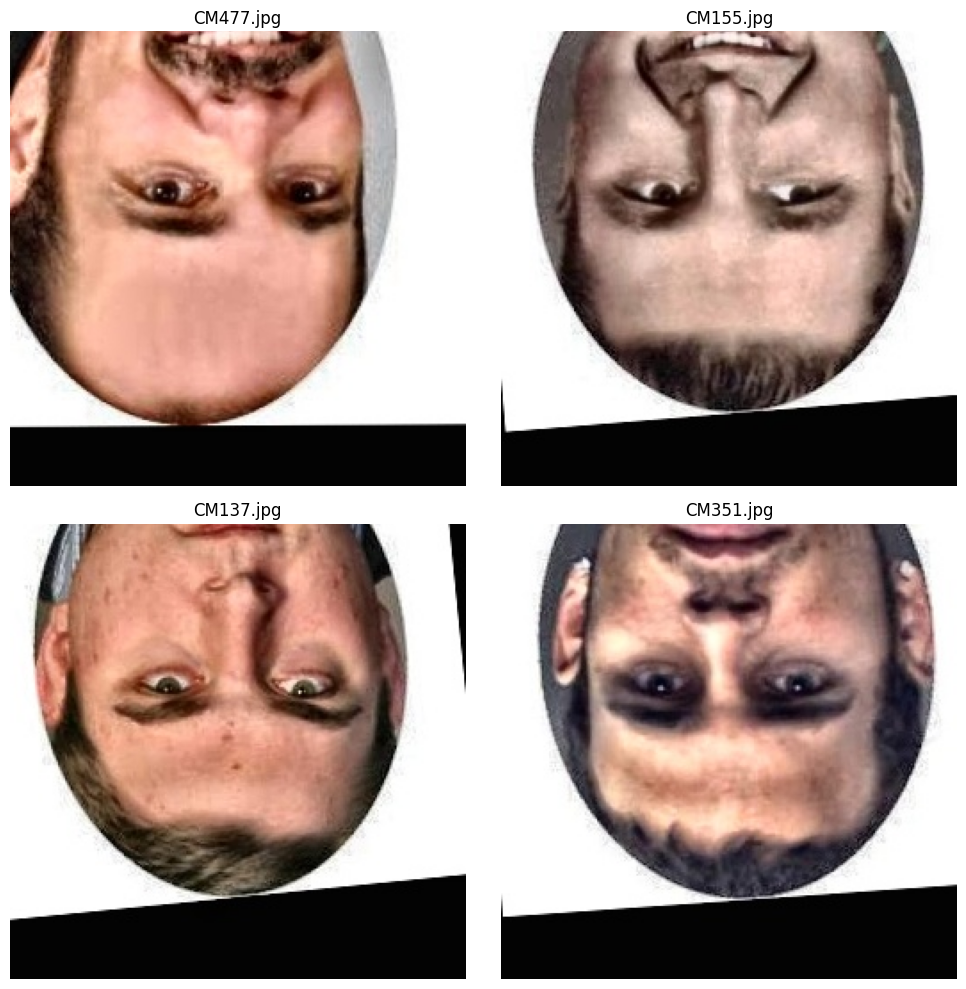

In [7]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Locate the preprocessed folder
possible_dirs = ['./CM_Faces_Preprocessed', '/content/CM_Faces_Preprocessed']
folder = next((d for d in possible_dirs if os.path.isdir(d)), None)
if folder is None:
    raise FileNotFoundError(f"No preprocessed folder found. Checked: {possible_dirs}")

# Gather image files
image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
if len(image_files) < 4:
    raise ValueError(f"Not enough images to display. Found {len(image_files)} images in {folder}")

# Randomly select 4 images
sample_files = random.sample(image_files, 4)

# Display in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
for ax, fname in zip(axes.flatten(), sample_files):
    img = cv2.imread(os.path.join(folder, fname))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.axis('off')
    ax.set_title(fname)

plt.tight_layout()
plt.show()


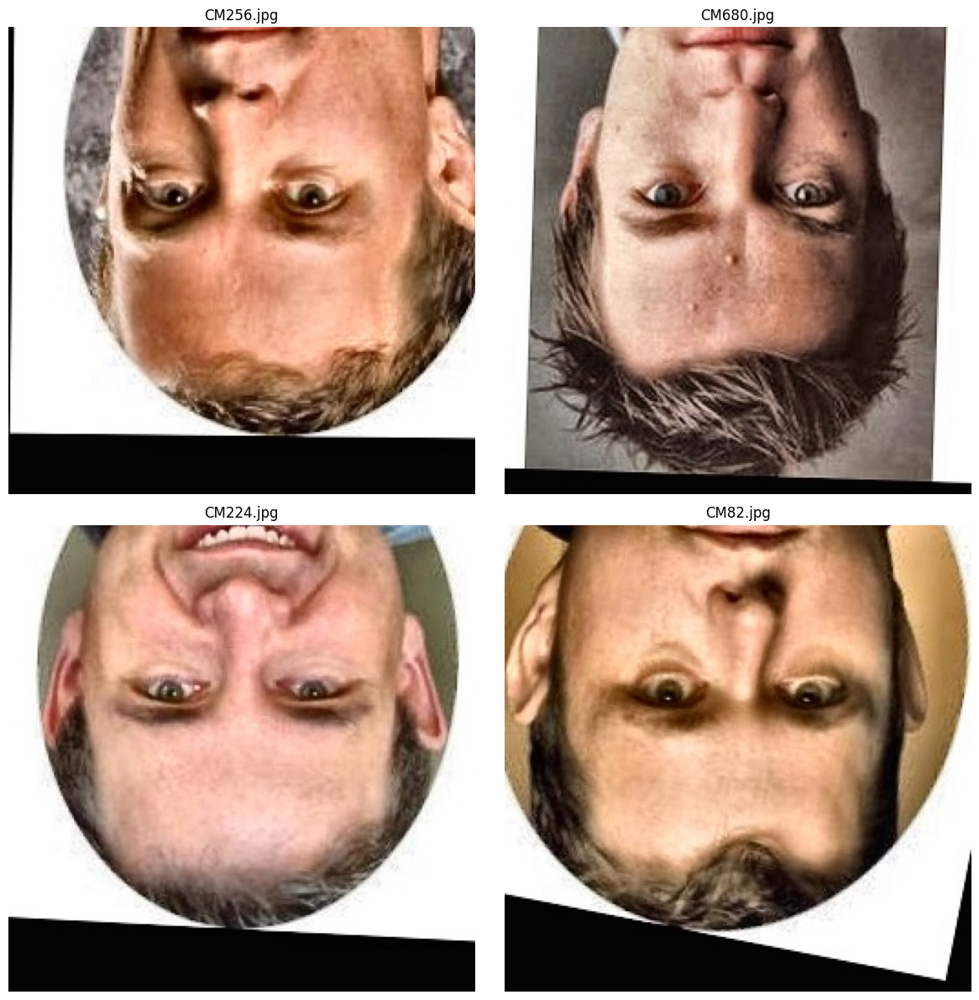

In [9]:
# Visualize 68 Facial Landmarks on Sample Images

import os
import random
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

# Paths
predictor_path = "shape_predictor_68_face_landmarks.dat"
image_folder = "./CM_Faces_Preprocessed"

# Initialize dlib's face detector and shape predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Select 4 random sample images
all_images = [f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
sample_images = random.sample(all_images, 4)

# Create a 2x2 subplot
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for ax, img_name in zip(axes.flatten(), sample_images):
    img_path = os.path.join(image_folder, img_name)

    # Read and convert to RGB
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Detect faces
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = detector(gray)

    # Draw landmarks for each face detected (should be one per image)
    for face in faces:
        landmarks = predictor(gray, face)
        # Loop over each of the 68 landmark points
        for n in range(68):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            cv2.circle(img_rgb, (x, y), 2, (0, 255, 0), -1)

    # Display
    ax.imshow(img_rgb)
    ax.set_title(img_name)
    ax.axis('off')

plt.tight_layout()
plt.show()


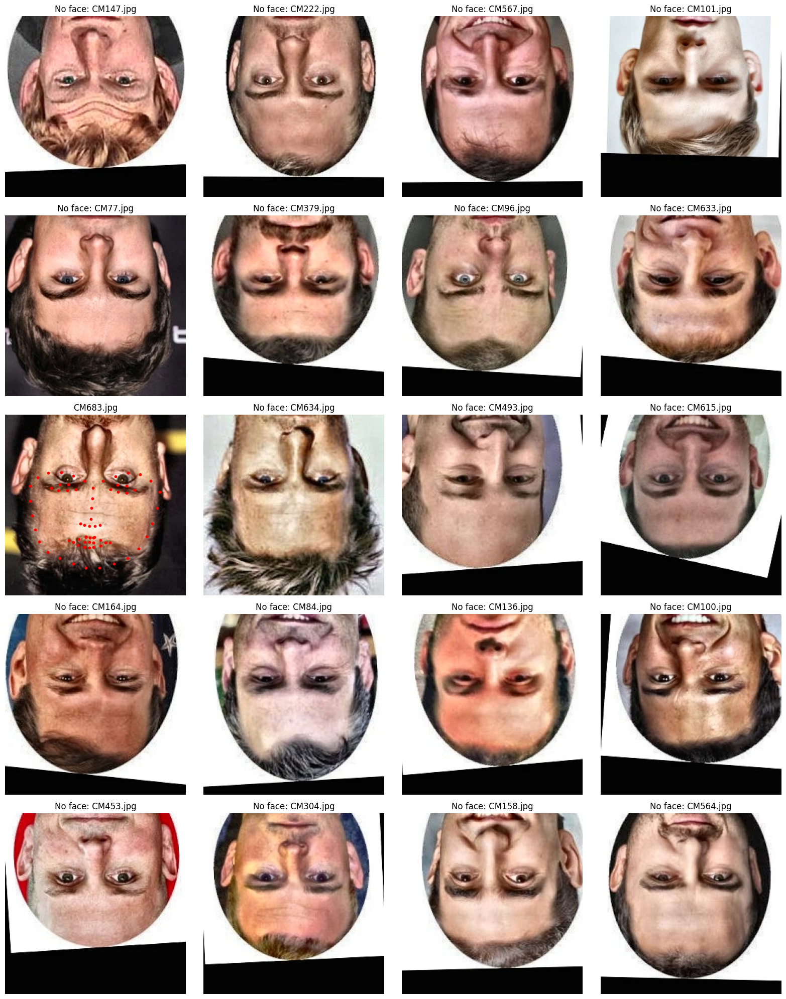

In [10]:
import os
import random
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

# Paths
src_folder = './CM_Faces_Preprocessed'  # or './CM_Faces' if using original images
predictor_path = "shape_predictor_68_face_landmarks.dat"

# Initialize dlib detector and predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Gather image files
image_files = [f for f in os.listdir(src_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
if len(image_files) < 20:
    raise ValueError(f"Need at least 20 images, found {len(image_files)}")

# Randomly select 20 images
sample_files = random.sample(image_files, 20)

# Prepare grid
rows, cols = 5, 4
fig, axes = plt.subplots(rows, cols, figsize=(16, 20))
axes = axes.flatten()

for ax, fname in zip(axes, sample_files):
    img_path = os.path.join(src_folder, fname)
    img = cv2.imread(img_path)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect face and landmarks
    faces = detector(gray, 1)
    if faces:
        shape = predictor(gray, faces[0])
        coords = np.array([(shape.part(i).x, shape.part(i).y) for i in range(68)])

        # Plot image and landmarks
        ax.imshow(rgb)
        ax.scatter(coords[:, 0], coords[:, 1], s=10, c='r')
        ax.set_title(fname)
    else:
        ax.imshow(rgb)
        ax.set_title(f"No face: {fname}")

    ax.axis('off')

plt.tight_layout()
plt.show()


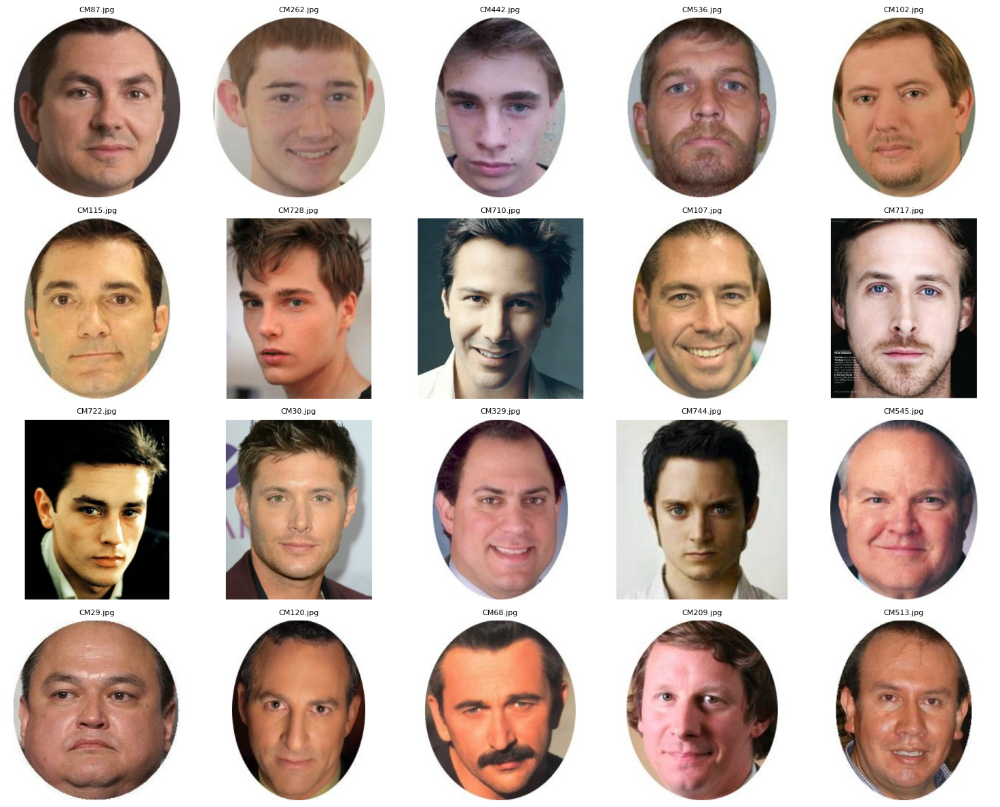

In [11]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Try possible directories
possible_dirs = ['./CM_Faces', '/content/CM_Faces']
folder = next((d for d in possible_dirs if os.path.isdir(d)), None)
if folder is None:
    raise FileNotFoundError(f"CM_Faces directory not found. Checked: {possible_dirs}")

# List all image files
image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
if len(image_files) < 20:
    raise ValueError(f"Not enough images to display (found {len(image_files)}).")

# Randomly select 20 images
sample_files = random.sample(image_files, 20)

# Set up a 4x5 grid for visualization
rows, cols = 4, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))

# Plot each selected image
for ax, fname in zip(axes.flatten(), sample_files):
    img_path = os.path.join(folder, fname)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.set_title(fname, fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()


--- Downloading and Extracting dlib shape predictor model ---
--2025-04-29 15:33:57--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-04-29 15:33:57--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2.1’

shape_predictor_68_ 100%[===================>]  61.07M  30.4MB/s    in 2.0s    

2025-04-29 15:33:59 (30.4 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2.1’ saved [64040097/64040097]

bunzip2: Output file shape_predictor_68_face_landmarks.dat already exists.
Download and Extraction Complete.
-rw-r

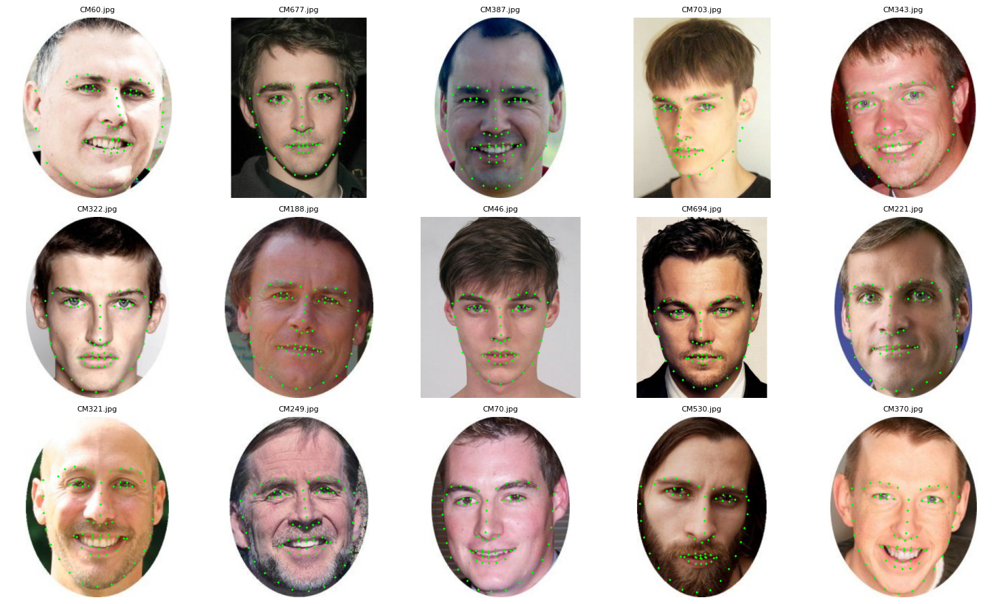


--- Script Finished ---


In [15]:
# --- STEP 1 & 2: Download and Extract dlib shape predictor model ---
# This downloads the compressed model file into your Colab session's current directory (/content/)
# and then extracts it. This is required for dlib to find facial landmarks.

print("--- Downloading and Extracting dlib shape predictor model ---")
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bunzip2 shape_predictor_68_face_landmarks.dat.bz2
print("Download and Extraction Complete.")

# Optional: Verify the file is there
!ls -l shape_predictor_68_face_landmarks.dat
print("-" * 40)


# --- STEP 3: Python Code for Golden Ratio Calculation ---

import os
import random
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

print("--- Starting Facial Golden Ratio Analysis Script ---")

# --- Configuration ---
# Try possible directories for CM_Faces.
# Includes common Colab locations like the default /content/ and a typical Google Drive mount path.
possible_dirs = ['./CM_Faces', '/content/CM_Faces', '/content/drive/MyDrive/CM_Faces']
folder = next((d for d in possible_dirs if os.path.isdir(d)), None)

# Add more specific instructions if the folder isn't found
if folder is None:
    print("\nERROR: CM_Faces directory not found in common locations.")
    print("Please ensure your 'CM_Faces' folder is:")
    print("1. Uploaded directly to the file explorer in your Colab session's root directory (/content/).")
    print("OR")
    print("2. Located in your Google Drive and you have mounted your drive (Click the folder icon on the left -> Mount Drive). A common path is /content/drive/MyDrive/CM_Faces.")
    raise FileNotFoundError(f"CM_Faces directory not found. Checked: {possible_dirs}")
else:
    print(f"CM_Faces directory found at: {folder}")


# Path to the dlib shape predictor model (should now be in the current directory /content/ after running the first cell)
shape_predictor_path = 'shape_predictor_68_face_landmarks.dat'
# A final check to be safe, although the download steps should ensure it's there
if not os.path.exists(shape_predictor_path):
     raise FileNotFoundError(f"Dlib shape predictor model not found at {shape_predictor_path}. Please ensure the download and extraction steps ran successfully.")


# --- Initialize Dlib ---
print("Initializing dlib face detector and shape predictor...")
# Using the default frontal face detector
detector = dlib.get_frontal_face_detector()
# Load the landmark prediction model
predictor = dlib.shape_predictor(shape_predictor_path)
print("Initialization complete.")


# --- Golden Ratio (phi) ---
phi = (1 + np.sqrt(5)) / 2
print(f"Target Golden Ratio (phi): {phi:.4f}")


# --- Function to calculate distances and ratios ---
# This function takes the 68 landmark points and calculates various proportions.
# The specific ratios are examples based on common facial aesthetic concepts,
# often cited in relation to the golden ratio.
def calculate_facial_ratios(landmarks):
    """
    Calculates several common facial ratios based on 68 landmark points.
    Returns a dictionary of ratios.
    """
    # Convert dlib shape object to numpy array for easier indexing and calculations
    points = np.array([[p.x, p.y] for p in landmarks.parts()])

    ratios = {}

    # --- Common Ratios Based on 68 Landmarks (Examples) ---
    # Note: These are interpretations. Facial aesthetics is complex and not defined by a single number.

    # 1. Ratio of Face Length (approx. nose bridge top to chin tip) to Face Width (outer jaw)
    # Landmarks: 27 (top of nose bridge), 8 (chin tip), 0 (left jaw), 16 (right jaw)
    face_length = np.linalg.norm(points[27] - points[8])
    face_width = np.linalg.norm(points[0] - points[16])
    if face_width > 0:
        ratios['FaceLength_to_FaceWidth'] = face_length / face_width
    else:
         ratios['FaceLength_to_FaceWidth'] = np.nan # Handle zero width


    # 2. Ratio of Mouth Width to Nose Width
    # Landmarks: Mouth corners 48, 54. Nose base corners 31, 35
    mouth_width = np.linalg.norm(points[48] - points[54])
    nose_width = np.linalg.norm(points[31] - points[35])
    if nose_width > 0:
        ratios['MouthWidth_to_NoseWidth'] = mouth_width / nose_width
    else:
        ratios['MouthWidth_to_NoseWidth'] = np.nan


    # 3. Ratio of Distance from Nose tip to Chin tip vs. Nose tip to Mouth center
    # This ratio is often cited as a golden ratio proportion for the lower face.
    # Landmarks: Nose tip 30, Chin tip 8. Mouth center (approx avg of 62, 66 for inner or 60, 64 for outer)
    nose_tip = points[30]
    chin_tip = points[8]
    # Using the average of outer mouth corners for simplicity of 'mouth center' point
    mouth_center = (points[60] + points[64]) / 2

    dist_nose_to_chin = np.linalg.norm(nose_tip - chin_tip)
    dist_nose_to_mouth = np.linalg.norm(nose_tip - mouth_center)

    if dist_nose_to_mouth > 0:
         ratios['NoseToChin_to_NoseToMouth'] = dist_nose_to_chin / dist_nose_to_mouth
    else:
         ratios['NoseToChin_to_NoseToMouth'] = np.nan


    # 4. Ratio related to eye spacing and face width
    # Ratio: Overall Face Width / Distance between outer eye corners
    # Landmarks: Outer eye corners 36, 45. Outer jaw 0, 16
    dist_eye_outer_corners = np.linalg.norm(points[36] - points[45])
    # Face width is already calculated as face_width
    if dist_eye_outer_corners > 0:
         ratios['FaceWidth_to_EyeDistance'] = face_width / dist_eye_outer_corners
    else:
         ratios['FaceWidth_to_EyeDistance'] = np.nan


    # 5. Distance between pupil centers (approx) / distance from upper lip to lower lip (approx)
    # Landmarks: Pupils are not directly marked in 68 points, so we estimate.
    # Approx pupil locations: average of inner/outer eye corners for each eye.
    # Left pupil approx: (points[36] + points[39]) / 2
    # Right pupil approx: (points[42] + points[45]) / 2
    # Upper lip center: 51, Lower lip center: 57 (approx vertical distance)
    left_pupil_approx = (points[36] + points[39]) / 2
    right_pupil_approx = (points[42] + points[45]) / 2
    dist_pupil_centers = np.linalg.norm(left_pupil_approx - right_pupil_approx)

    dist_upper_lower_lip = np.linalg.norm(points[51] - points[57]) # Approx vertical distance

    if dist_upper_lower_lip > 0:
         ratios['PupilDistance_to_LipHeight'] = dist_pupil_centers / dist_upper_lower_lip
    else:
         ratios['PupilDistance_to_LipHeight'] = np.nan


    return ratios

# --- Process Images and Calculate Ratios ---
image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
if not image_files:
    raise ValueError(f"No image files found in {folder}. Please ensure your CM_Faces folder contains images.")

print(f"Found {len(image_files)} images in {folder}. Processing...")

all_face_ratios = {}
images_with_landmarks = [] # To store a sample of images with drawn landmarks for visualization

# Set a limit on images to process if your dataset is very large,
# otherwise Colab might run out of memory or time. Process all by default:
max_images_to_process = len(image_files)
# Or process a smaller number for testing:
# max_images_to_process = 100

processed_count = 0

for fname in image_files[:max_images_to_process]:
    img_path = os.path.join(folder, fname)
    img = cv2.imread(img_path)

    if img is None:
        print(f"Warning: Could not read image {fname}. Skipping.")
        all_face_ratios[fname] = "Could not read image"
        continue

    # Convert image to grayscale, which is typical for dlib's detector and predictor
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    if len(faces) == 0:
        # print(f"Info: No face detected in {fname}. Skipping.") # Uncomment if you want to see skipped files
        all_face_ratios[fname] = "No face detected"
        continue
    # Handle cases with multiple faces: select the largest one by bounding box area
    elif len(faces) > 1:
        # print(f"Info: More than one face detected in {fname}. Selecting largest.") # Uncomment if you want to see skipped files
        areas = [face.area() for face in faces]
        largest_face_index = np.argmax(areas)
        face = faces[largest_face_index]
    else:
        face = faces[0] # Only one face detected

    # Get the landmarks for the detected face region
    try:
        landmarks = predictor(gray, face)
        # Calculate the predefined facial ratios
        ratios = calculate_facial_ratios(landmarks)
        # Store the results
        all_face_ratios[fname] = ratios
        processed_count += 1

        # Optional: Draw landmarks on a *sample* of images for visualization
        # Limiting the number saves memory and makes display faster for large datasets
        if len(images_with_landmarks) < 20: # Only store up to 20 images for visualization
            img_display = img.copy()
            # Draw the 68 landmark points
            for i in range(landmarks.num_parts):
                point = landmarks.part(i)
                cv2.circle(img_display, (point.x, point.y), 2, (0, 255, 0), -1) # Draw green circle point
                # Optional: Add point index text (can be cluttered)
                # cv2.putText(img_display, str(i), (point.x, point.y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 255), 1)
            images_with_landmarks.append((fname, img_display))

    except Exception as e:
        print(f"Error processing landmarks for {fname}: {e}")
        all_face_ratios[fname] = f"Error processing landmarks: {e}"
        continue

print(f"\nFinished processing. Successfully processed {processed_count} images with face and landmark detection.")
print(f"Skipped {len(image_files[:max_images_to_process]) - processed_count} images (no face detected or processing error).")


# --- Analyze and Display Results ---

print("\n--- Facial Golden Ratio Analysis Results ---")
print(f"Target Golden Ratio (phi): {phi:.4f}\n")

# Collect all valid ratios for statistical analysis
# Define the keys expected from the calculate_facial_ratios function
ratio_keys = ['FaceLength_to_FaceWidth', 'MouthWidth_to_NoseWidth', 'NoseToChin_to_NoseToMouth', 'FaceWidth_to_EyeDistance', 'PupilDistance_to_LipHeight']
ratio_data = {ratio_name: [] for ratio_name in ratio_keys}
skipped_files_list = []

# Iterate through the stored results to print individual results and collect data for stats
for fname, result in all_face_ratios.items():
    if isinstance(result, dict):
        print(f"File: {fname}")
        for ratio_name in ratio_keys: # Iterate through the defined keys to ensure consistent output
             value = result.get(ratio_name, np.nan) # Use .get to safely retrieve values, defaulting to NaN if missing
             if not np.isnan(value):
                 print(f"  {ratio_name}: {value:.4f} (Diff from phi: {abs(value - phi):.4f})")
                 ratio_data[ratio_name].append(value)
             else:
                  print(f"  {ratio_name}: N/A (Calculation failed or not applicable)")
    else:
        # Handle files that were skipped (no face or read error)
        # print(f"File: {fname} - Skipped ({result})") # Uncomment if you want to see why each file was skipped
        skipped_files_list.append(fname)


print("\n--- Summary Statistics Across Dataset ---")
print(f"Total images in directory: {len(image_files)}")
print(f"Images attempted processing (up to max_images_to_process): {len(image_files[:max_images_to_process])}")
print(f"Images processed successfully with ratios: {processed_count}")
print(f"Images skipped (No face / Read Error / Landmark Error): {len(skipped_files_list)}")


# Calculate and print statistics for each ratio type
for ratio_name, values in ratio_data.items():
    if values:
        mean_ratio = np.mean(values)
        median_ratio = np.median(values)
        std_ratio = np.std(values)
        count = len(values)
        print(f"\nRatio: {ratio_name} (n={count} images)")
        print(f"  Mean: {mean_ratio:.4f}")
        print(f"  Median: {median_ratio:.4f}")
        print(f"  Standard Deviation: {std_ratio:.4f}")
        print(f"  Mean Absolute Difference from phi: {np.mean(np.abs(np.array(values) - phi)):.4f}") # More representative avg diff
    else:
        print(f"\nRatio: {ratio_name} - No data available from successfully processed images.")


# --- Visualize a few images with landmarks (Optional) ---
# This helps visually confirm that landmark detection is working correctly.
if images_with_landmarks:
    print("\n--- Displaying Sample Images with Landmarks ---")
    # Randomly select a few images from the ones that had landmarks detected
    sample_images_to_show = min(15, len(images_with_landmarks)) # Show up to 15 samples
    sample_display_list = random.sample(images_with_landmarks, sample_images_to_show)

    # Determine grid size for plotting
    cols = 5
    rows = (sample_images_to_show + cols - 1) // cols # Calculate rows needed
    rows = max(1, rows) if sample_images_to_show > 0 else 0 # Ensure at least 1 row if showing images

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))

    # Flatten the axes array for easy iteration, regardless of grid size
    if sample_images_to_show <= cols: # If 1 row or less
         axes = axes.flatten()[:sample_images_to_show] # Only take the number needed if less than a full row
         if sample_images_to_show == 1: # Handle the case of a single image specifically
             axes = [axes]
    else: # Multiple rows
         axes = axes.flatten()

    # Plot each selected image with landmarks
    for i, (fname, img_display) in enumerate(sample_display_list):
        ax = axes[i]
        # Convert BGR (OpenCV default) to RGB for Matplotlib display
        ax.imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
        ax.set_title(fname, fontsize=8)
        ax.axis('off') # Hide axes

    # Hide any unused subplots if the number of samples is less than the total grid size
    for j in range(sample_images_to_show, len(axes)):
         axes[j].axis('off')


    plt.tight_layout() # Adjust layout to prevent titles/labels overlapping
    plt.show()

else:
    print("\nNo images with landmarks were available for visualization samples (either none processed or sample limit reached).")

print("\n--- Script Finished ---")

Streaming output truncated to the last 5000 lines.
  Feature_BrowRidgeProtrusion: N/A
  Feature_ChinProminence: N/A
File: CM212.jpg
  Ratio_FaceLength_to_FaceWidth: 0.8650
  Ratio_MouthWidth_to_NoseWidth: 2.0438
  Ratio_NoseToChin_to_NoseToMouth: 2.5320
  Ratio_FaceWidth_to_EyeDistance: 1.6798
  Ratio_PupilDistance_to_LipHeight: 3.3193
  Feature_Symmetry_DistSum: 101.2263
  Feature_fWHR: N/A
  Feature_JawAngle_at_Chin: 113.3198
  Feature_LipFullness_Index: 0.3112
  Feature_PupilDistance_to_FaceWidth_Ratio: 0.4325
  Feature_NoseLength_to_Width_Ratio: 1.1945
  Feature_InnerCanthus_to_NoseWidth_Ratio: 1.3170
  Feature_Averageness_Mahalanobis: N/A
  Feature_BrowRidgeProtrusion: N/A
  Feature_ChinProminence: N/A
File: CM373.jpg
  Ratio_FaceLength_to_FaceWidth: 0.8659
  Ratio_MouthWidth_to_NoseWidth: 1.9262
  Ratio_NoseToChin_to_NoseToMouth: 3.0849
  Ratio_FaceWidth_to_EyeDistance: 1.6361
  Ratio_PupilDistance_to_LipHeight: 2.9582
  Feature_Symmetry_DistSum: 103.0297
  Feature_fWHR: N/A
  Fe

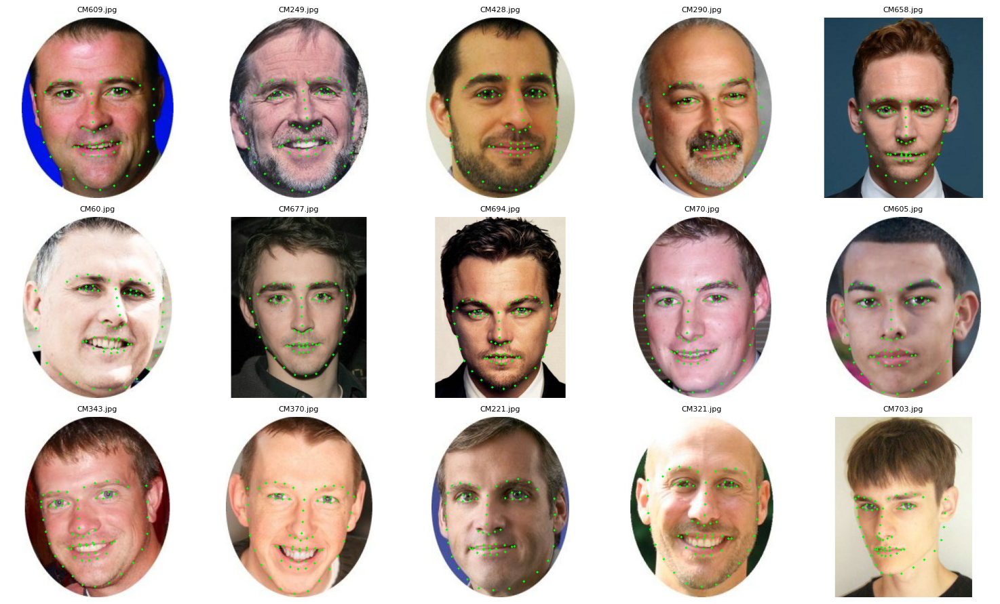


--- Script Finished ---


In [16]:
# --- STEP 1 & 2: Download and Extract dlib shape predictor model ---
# This downloads the compressed model file into your Colab session's current directory (/content/)
# and then extracts it. This is required for dlib to find facial landmarks.

print("--- Downloading and Extracting dlib shape predictor model ---")
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bunzip2 shape_predictor_68_face_landmarks.dat.bz2
print("Download and Extraction Complete.")

# Optional: Verify the file is there
!ls -l shape_predictor_68_face_landmarks.dat
print("-" * 40)


# --- STEP 3: Python Code for Facial Feature Calculation ---

import os
import random
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt
import math # Import for math functions like cos, acos

print("--- Starting Facial Feature Calculation Script ---")

# --- Configuration ---
# Try possible directories for CM_Faces.
# Includes common Colab locations like the default /content/ and a typical Google Drive mount path.
possible_dirs = ['./CM_Faces', '/content/CM_Faces', '/content/drive/MyDrive/CM_Faces']
folder = next((d for d in possible_dirs if os.path.isdir(d)), None)

# Add more specific instructions if the folder isn't found
if folder is None:
    print("\nERROR: CM_Faces directory not found in common locations.")
    print("Please ensure your 'CM_Faces' folder is:")
    print("1. Uploaded directly to the file explorer in your Colab session's root directory (/content/).")
    print("OR")
    print("2. Located in your Google Drive and you have mounted your drive (Click the folder icon on the left -> Mount Drive). A common path is /content/drive/MyDrive/CM_Faces.")
    raise FileNotFoundError(f"CM_Faces directory not found. Checked: {possible_dirs}")
else:
    print(f"CM_Faces directory found at: {folder}")


# Path to the dlib shape predictor model (should now be in the current directory /content/ after running the first cell)
shape_predictor_path = 'shape_predictor_68_face_landmarks.dat'
# A final check to be safe, although the download steps should ensure it's there
if not os.path.exists(shape_predictor_path):
     raise FileNotFoundError(f"Dlib shape predictor model not found at {shape_predictor_path}. Please ensure the download and extraction steps ran successfully.")


# --- Initialize Dlib ---
print("Initializing dlib face detector and shape predictor...")
# Using the default frontal face detector
detector = dlib.get_frontal_face_detector()
# Load the landmark prediction model
predictor = dlib.shape_predictor(shape_predictor_path)
print("Initialization complete.")


# --- Function to calculate various facial features from landmarks ---
# This function now calculates more features, including those related to symmetry, sexual dimorphism approximations, etc.
def calculate_facial_features(landmarks):
    """
    Calculates various facial features based on 68 landmark points.
    Returns a dictionary of feature values.
    """
    # Convert dlib shape object to numpy array for easier indexing and calculations
    points = np.array([[p.x, p.y] for p in landmarks.parts()])

    features = {}

    # --- Basic Ratios (from previous code, often related to Golden Ratio theories) ---
    phi = (1 + np.sqrt(5)) / 2 # Define phi here for calculating diffs if desired, but main output is the ratio value

    # 1. Ratio of Face Length (approx. nose bridge top to chin tip) to Face Width (outer jaw)
    face_length = np.linalg.norm(points[27] - points[8])
    face_width = np.linalg.norm(points[0] - points[16])
    features['Ratio_FaceLength_to_FaceWidth'] = face_length / face_width if face_width > 0 else np.nan

    # 2. Ratio of Mouth Width to Nose Width
    mouth_width = np.linalg.norm(points[48] - points[54])
    nose_width = np.linalg.norm(points[31] - points[35])
    features['Ratio_MouthWidth_to_NoseWidth'] = mouth_width / nose_width if nose_width > 0 else np.nan

    # 3. Ratio of Distance from Nose tip to Chin tip vs. Nose tip to Mouth center (Lower face proportion)
    nose_tip = points[30]
    chin_tip = points[8]
    mouth_center = (points[60] + points[64]) / 2
    dist_nose_to_chin = np.linalg.norm(nose_tip - chin_tip)
    dist_nose_to_mouth = np.linalg.norm(nose_tip - mouth_center)
    features['Ratio_NoseToChin_to_NoseToMouth'] = dist_nose_to_chin / dist_nose_to_mouth if dist_nose_to_mouth > 0 else np.nan

    # 4. Ratio of Overall Face Width to Distance between outer eye corners
    dist_eye_outer_corners = np.linalg.norm(points[36] - points[45])
    features['Ratio_FaceWidth_to_EyeDistance'] = face_width / dist_eye_outer_corners if dist_eye_outer_corners > 0 else np.nan

    # 5. Ratio of Distance between pupil centers (approx) to distance from upper lip to lower lip (approx)
    left_pupil_approx = (points[36] + points[39]) / 2
    right_pupil_approx = (points[42] + points[45]) / 2
    dist_pupil_centers = np.linalg.norm(left_pupil_approx - right_pupil_approx)
    dist_upper_lower_lip = np.linalg.norm(points[51] - points[57]) # Approx vertical distance
    features['Ratio_PupilDistance_to_LipHeight'] = dist_pupil_centers / dist_upper_lower_lip if dist_upper_lower_lip > 0 else np.nan

    # --- Additional Features based on your list (Feasible with 2D Landmarks) ---

    # 6. Facial Symmetry (Approximation using Procrustes Distance on Landmarks)
    # Reflect landmarks across the vertical midline (estimated as the line passing through point 27, nose bridge top)
    # We need a reference midline. Point 27 (nose bridge) is a good central point.
    # Reflect points relative to the x-coordinate of point 27.
    midline_x = points[27][0]
    reflected_points = points.copy()
    reflected_points[:, 0] = midline_x + (midline_x - points[:, 0]) # Reflect x-coordinates

    # Some landmarks are central (like 27, 30, 33, 51, 62, 66), they should ideally not move when reflected.
    # Others have natural pairs (0 and 16, 1 and 15, ..., 36 and 45, 48 and 54, etc.)
    # A more accurate symmetry might compare landmark i to its corresponding reflected landmark j.
    # For simplicity here, let's use a basic Procrustes-like distance sum between original and *reflected* points.
    # Normalize by a relevant facial dimension, e.g., face width or interocular distance.
    interocular_distance = np.linalg.norm(points[39] - points[42]) # Distance between inner eye corners
    if interocular_distance == 0: interocular_distance = np.nan # Avoid division by zero

    # Basic sum of distances between original points and their reflection
    # Note: This doesn't account for rotation/scaling differences, a true Procrustes aligns first.
    # This is a simplified distance-based asymmetry score.
    # Let's calculate the sum of Euclidean distances between original points and their reflections
    sum_dist_asymmetry = np.sum(np.linalg.norm(points - reflected_points, axis=1))
    features['Feature_Symmetry_DistSum'] = sum_dist_asymmetry / interocular_distance if not np.isnan(interocular_distance) else np.nan


    # 7. fWHR (Facial Width-to-Height Ratio - Landmark Approximation)
    # Bizygomatic width (landmarks 0-16)
    # Upper facial height (approx. from mid-brow (avg Y of 20-25) to upper lip (point 51))
    bizygomatic_width = np.linalg.norm(points[0] - points[16])
    mid_brow_y = np.mean(points[20:26][:, 1]) # Average Y of points 20 through 25
    upper_lip_y = points[51][1]
    upper_face_height = mid_brow_y - upper_lip_y # Assuming brow is above upper lip

    features['Feature_fWHR'] = bizygomatic_width / upper_face_height if upper_face_height > 0 else np.nan # Height must be positive


    # 8. Jaw Angle (Approximation)
    # Angle formed at the chin point (8) by vectors from points 4 and 12 on the jawline.
    # Using points 4, 8, 12 as approximations for mandible angle points.
    p4 = points[4]
    p8 = points[8]
    p12 = points[12]

    vec_p8_p4 = p4 - p8
    vec_p8_p12 = p12 - p8

    dot_product = np.dot(vec_p8_p4, vec_p8_p12)
    norm_p8_p4 = np.linalg.norm(vec_p8_p4)
    norm_p8_p12 = np.linalg.norm(vec_p8_p12)

    # Avoid division by zero or NaN if points are identical
    if norm_p8_p4 > 0 and norm_p8_p12 > 0:
        # Ensure dot product / norms is within valid range for arccos [-1, 1] due to floating point errors
        cosine_angle = dot_product / (norm_p8_p4 * norm_p8_p12)
        cosine_angle = np.clip(cosine_angle, -1.0, 1.0)
        angle_rad = math.acos(cosine_angle)
        angle_deg = math.degrees(angle_rad)
        features['Feature_JawAngle_at_Chin'] = angle_deg
    else:
        features['Feature_JawAngle_at_Chin'] = np.nan


    # 9. Lip Fullness Index (Ratio of Lip Height to Mouth Width)
    # Lip Height (approx. vertical distance between 51 and 57)
    # Mouth Width (distance between 48 and 54)
    lip_height = np.linalg.norm(points[51] - points[57])
    mouth_width = np.linalg.norm(points[48] - points[54]) # Already calculated above, reuse if preferred
    features['Feature_LipFullness_Index'] = lip_height / mouth_width if mouth_width > 0 else np.nan


    # 10. Interpupillary Distance Ratio (Ratio of Pupil Distance to Face Width)
    # Pupil Distance (approx. between estimated pupils, already calculated as dist_pupil_centers)
    # Face Width (bizygomatic width 0-16, already calculated as bizygomatic_width or face_width)
    features['Feature_PupilDistance_to_FaceWidth_Ratio'] = dist_pupil_centers / face_width if face_width > 0 else np.nan


    # 11. Nose Ratio (Length to Width)
    # Nose Length (approx. distance from nose bridge top 27 to nose tip 30)
    # Nose Width (distance between base corners 31, 35)
    nose_length = np.linalg.norm(points[27] - points[30])
    nose_width = np.linalg.norm(points[31] - points[35]) # Already calculated above, reuse if preferred
    features['Feature_NoseLength_to_Width_Ratio'] = nose_length / nose_width if nose_width > 0 else np.nan


    # 12. Inner Canthus Width to Nose Width Ratio
    # Inner Canthus Width (distance between inner eye corners 39, 42)
    # Nose Width (distance between base corners 31, 35)
    inner_canthus_width = np.linalg.norm(points[39] - points[42]) # Already calculated as interocular_distance
    nose_width = np.linalg.norm(points[31] - points[35]) # Already calculated above, reuse if preferred
    features['Feature_InnerCanthus_to_NoseWidth_Ratio'] = inner_canthus_width / nose_width if nose_width > 0 else np.nan


    # --- Features NOT easily feasible with 2D Landmarks Alone ---
    # Averageness (requires comparison to a mean face model built from a dataset, not calculable per image)
    # Brow Ridge Protrusion Index (requires 3D data)
    # Chin Prominence Index (requires 3D data or profile view analysis)
    # Facial Expression (requires a separate trained CNN model)
    # Skin Texture (requires texture analysis algorithms like GLCM, applied to a region, not just landmarks)
    # We will add placeholders for these or simply document why they aren't included here.

    # Add placeholders for features requiring different methods if you want them in the dictionary structure
    features['Feature_Averageness_Mahalanobis'] = np.nan # Requires dataset PCA model
    features['Feature_BrowRidgeProtrusion'] = np.nan # Requires 3D data
    features['Feature_ChinProminence'] = np.nan # Requires 3D data or profile
    # features['Feature_Expression'] = np.nan # Requires CNN model (can be added later)
    # features['Feature_SkinTexture_Homogeneity'] = np.nan # Requires texture analysis (can be added later)
    # features['Feature_SkinTexture_Entropy'] = np.nan # Requires texture analysis (can be added later)


    return features

# --- Process Images and Calculate Features ---
image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
if not image_files:
    raise ValueError(f"No image files found in {folder}. Please ensure your CM_Faces folder contains images.")

print(f"Found {len(image_files)} images in {folder}. Processing...")

all_face_features = {} # Changed dictionary name to reflect calculating features, not just ratios
images_with_landmarks = [] # To store a sample of images with drawn landmarks for visualization

# Set a limit on images to process if your dataset is very large,
# otherwise Colab might run out of memory or time. Process all by default:
max_images_to_process = len(image_files)
# Or process a smaller number for testing:
# max_images_to_process = 100

processed_count = 0

for fname in image_files[:max_images_to_process]:
    img_path = os.path.join(folder, fname)
    img = cv2.imread(img_path)

    if img is None:
        print(f"Warning: Could not read image {fname}. Skipping.")
        all_face_features[fname] = "Could not read image"
        continue

    # Convert image to grayscale, which is typical for dlib's detector and predictor
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    if len(faces) == 0:
        # print(f"Info: No face detected in {fname}. Skipping.") # Uncomment if you want to see skipped files
        all_face_features[fname] = "No face detected"
        continue
    # Handle cases with multiple faces: select the largest one by bounding box area
    elif len(faces) > 1:
        # print(f"Info: More than one face detected in {fname}. Selecting largest.") # Uncomment if you want to see skipped files
        areas = [face.area() for face in faces]
        largest_face_index = np.argmax(areas)
        face = faces[largest_face_index]
    else:
        face = faces[0] # Only one face detected

    # Get the landmarks for the detected face region
    try:
        landmarks = predictor(gray, face)
        # Calculate the various facial features
        features = calculate_facial_features(landmarks)
        # Store the results
        all_face_features[fname] = features
        processed_count += 1

        # Optional: Draw landmarks on a *sample* of images for visualization
        # Limiting the number saves memory and makes display faster for large datasets
        if len(images_with_landmarks) < 20: # Only store up to 20 images for visualization
            img_display = img.copy()
            # Draw the 68 landmark points
            for i in range(landmarks.num_parts):
                point = landmarks.part(i)
                cv2.circle(img_display, (point.x, point.y), 2, (0, 255, 0), -1) # Draw green circle point
                # Optional: Add point index text (can be cluttered)
                # cv2.putText(img_display, str(i), (point.x, point.y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 255), 1)
            images_with_landmarks.append((fname, img_display))

    except Exception as e:
        print(f"Error processing landmarks for {fname}: {e}")
        all_face_features[fname] = f"Error processing landmarks: {e}"
        continue

print(f"\nFinished processing. Successfully processed {processed_count} images with face and landmark detection.")
print(f"Skipped {len(image_files[:max_images_to_process]) - processed_count} images (no face detected or processing error).")


# --- Analyze and Display Results ---

print("\n--- Facial Feature Analysis Results ---")
# Re-calculate phi here if needed for comparison printouts, or just reference the value
phi = (1 + np.sqrt(5)) / 2

# Define all the feature keys calculated in the function
# Ensure this list is comprehensive of all keys added to the 'features' dictionary
feature_keys = [
    'Ratio_FaceLength_to_FaceWidth',
    'Ratio_MouthWidth_to_NoseWidth',
    'Ratio_NoseToChin_to_NoseToMouth',
    'Ratio_FaceWidth_to_EyeDistance',
    'Ratio_PupilDistance_to_LipHeight',
    'Feature_Symmetry_DistSum',
    'Feature_fWHR',
    'Feature_JawAngle_at_Chin',
    'Feature_LipFullness_Index',
    'Feature_PupilDistance_to_FaceWidth_Ratio', # Corrected name
    'Feature_NoseLength_to_Width_Ratio',
    'Feature_InnerCanthus_to_NoseWidth_Ratio',
    # Include placeholder keys for features not calculated yet if desired, or handle their absence
    'Feature_Averageness_Mahalanobis', # Expected but will be NaN
    'Feature_BrowRidgeProtrusion',   # Expected but will be NaN
    'Feature_ChinProminence',        # Expected but will be NaN
]


feature_data = {feature_name: [] for feature_name in feature_keys}
skipped_files_list = []

# Iterate through the stored results to print individual results and collect data for stats
for fname, result in all_face_features.items():
    if isinstance(result, dict):
        print(f"File: {fname}")
        for feature_name in feature_keys: # Iterate through the defined keys
             value = result.get(feature_name, np.nan) # Use .get to safely retrieve values, defaulting to NaN if missing
             if not np.isnan(value):
                 # Print formatting might vary based on feature type (ratio vs angle vs distance sum)
                 # For simplicity, print all as floats for now
                 print(f"  {feature_name}: {value:.4f}") # Removed Diff from phi here as it's not universally applicable
             else:
                  print(f"  {feature_name}: N/A") # Calculation failed or not applicable
    else:
        # Handle files that were skipped (no face or read error)
        # print(f"File: {fname} - Skipped ({result})") # Uncomment if you want to see why each file was skipped
        skipped_files_list.append(fname)


print("\n--- Summary Statistics Across Dataset ---")
print(f"Total images in directory: {len(image_files)}")
print(f"Images attempted processing (up to max_images_to_process): {len(image_files[:max_images_to_process])}")
print(f"Images processed successfully with features: {processed_count}")
print(f"Images skipped (No face / Read Error / Landmark Error): {len(skipped_files_list)}")


# Calculate and print statistics for each feature type
for feature_name, values in feature_data.items():
    # Filter out NaN values for statistics
    valid_values = np.array(values)[~np.isnan(values)]

    if len(valid_values) > 0:
        mean_feature = np.mean(valid_values)
        median_feature = np.median(valid_values)
        std_feature = np.std(valid_values)
        count = len(valid_values)
        print(f"\nFeature: {feature_name} (n={count} images)")
        print(f"  Mean: {mean_feature:.4f}")
        print(f"  Median: {median_feature:.4f}")
        print(f"  Standard Deviation: {std_feature:.4f}")

        # Optional: Add comparison to target values if known and applicable
        target_value = None
        comparison_text = ""
        if 'Ratio_' in feature_name and feature_name not in ['Ratio_PupilDistance_to_LipHeight']: # Ratios potentially related to phi
             target_value = phi
             comparison_text = f" (Mean Diff from phi: {abs(mean_feature - target_value):.4f})"
        elif feature_name == 'Feature_fWHR':
             # Common attractive fWHR range for males is ~1.85 - 2.05
             comparison_text = f" (Note: Attractive range often cited ~1.85-2.05 for males)"
        elif feature_name == 'Feature_JawAngle_at_Chin':
             # Common attractive jaw angle range is ~120 - 130 degrees
             comparison_text = f" (Note: Attractive range often cited ~120-130 degrees)"
        elif feature_name == 'Feature_PupilDistance_to_FaceWidth_Ratio':
             # Target ratio cited as ~0.46
             target_value = 0.46
             comparison_text = f" (Target ~0.46, Mean Diff: {abs(mean_feature - target_value):.4f})"
        elif feature_name == 'Feature_NoseLength_to_Width_Ratio':
             # Target ratio often cited ~1.6
             target_value = 1.6
             comparison_text = f" (Target ~1.6, Mean Diff: {abs(mean_feature - target_value):.4f})"
        elif feature_name == 'Feature_InnerCanthus_to_NoseWidth_Ratio':
              # Target ratio often cited ~1.2
              target_value = 1.2
              comparison_text = f" (Target ~1.2, Mean Diff: {abs(mean_feature - target_value):.4f})"
        elif feature_name == 'Feature_Symmetry_DistSum':
             # Target is 0 (perfect symmetry), lower is better
             comparison_text = " (Target: 0, Lower is more symmetrical)"


        print(f"  Standard Deviation: {std_feature:.4f}{comparison_text}") # Print comparison text here

    else:
        print(f"\nFeature: {feature_name} - No data available from successfully processed images.")


# --- Visualize a few images with landmarks (Optional) ---
# This helps visually confirm that landmark detection is working correctly.
if images_with_landmarks:
    print("\n--- Displaying Sample Images with Landmarks ---")
    # Randomly select a few images from the ones that had landmarks detected
    sample_images_to_show = min(15, len(images_with_landmarks)) # Show up to 15 samples
    sample_display_list = random.sample(images_with_landmarks, sample_images_to_show)

    # Determine grid size for plotting
    cols = 5
    rows = (sample_images_to_show + cols - 1) // cols # Calculate rows needed
    rows = max(1, rows) if sample_images_to_show > 0 else 0 # Ensure at least 1 row if showing images

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))

    # Flatten the axes array for easy iteration, regardless of grid size
    if sample_images_to_show <= cols: # If 1 row or less
         axes = axes.flatten()[:sample_images_to_show] # Only take the number needed if less than a full row
         if sample_images_to_show == 1: # Handle the case of a single image specifically
             axes = [axes]
    else: # Multiple rows
         axes = axes.flatten()

    # Plot each selected image with landmarks
    for i, (fname, img_display) in enumerate(sample_display_list):
        ax = axes[i]
        # Convert BGR (OpenCV default) to RGB for Matplotlib display
        ax.imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
        ax.set_title(fname, fontsize=8)
        ax.axis('off') # Hide axes

    # Hide any unused subplots if the number of samples is less than the total grid size
    for j in range(sample_images_to_show, len(axes)):
         axes[j].axis('off')


    plt.tight_layout() # Adjust layout to prevent titles/labels overlapping
    plt.show()

else:
    print("\nNo images with landmarks were available for visualization samples (either none processed or sample limit reached).")


print("\n--- Script Finished ---")

--- Downloading and Extracting dlib shape predictor model ---
--2025-04-29 17:37:00--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-04-29 17:37:00--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2.3’

shape_predictor_68_ 100%[===================>]  61.07M  32.5MB/s    in 1.9s    

2025-04-29 17:37:02 (32.5 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2.3’ saved [64040097/64040097]

bunzip2: Output file shape_predictor_68_face_landmarks.dat already exists.
Download and Extraction Complete.
-rw-r

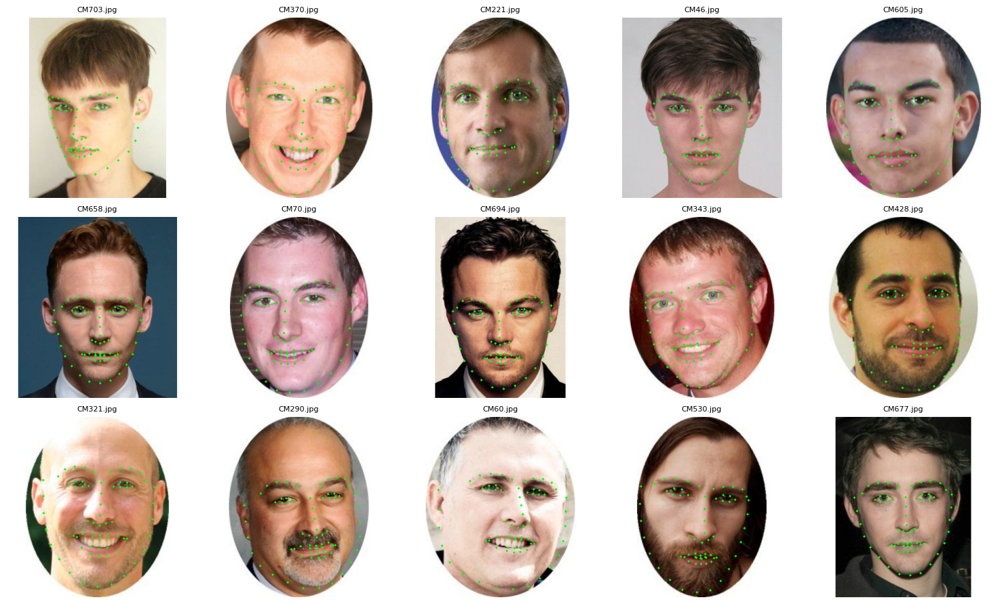


--- Script Finished ---


In [17]:
# --- STEP 1 & 2: Download and Extract dlib shape predictor model ---
# This downloads the compressed model file into your Colab session's current directory (/content/)
# and then extracts it. This is required for dlib to find facial landmarks.

print("--- Downloading and Extracting dlib shape predictor model ---")
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bunzip2 shape_predictor_68_face_landmarks.dat.bz2
print("Download and Extraction Complete.")

# Optional: Verify the file is there
!ls -l shape_predictor_68_face_landmarks.dat
print("-" * 40)


# --- STEP 3: Python Code for Facial Feature Calculation ---

import os
import random
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt
import math # Import for math functions like cos, acos

print("--- Starting Facial Feature Calculation Script ---")

# --- Configuration ---
# Try possible directories for CM_Faces.
# Includes common Colab locations like the default /content/ and a typical Google Drive mount path.
possible_dirs = ['./CM_Faces', '/content/CM_Faces', '/content/drive/MyDrive/CM_Faces']
folder = next((d for d in possible_dirs if os.path.isdir(d)), None)

# Add more specific instructions if the folder isn't found
if folder is None:
    print("\nERROR: CM_Faces directory not found in common locations.")
    print("Please ensure your 'CM_Faces' folder is:")
    print("1. Uploaded directly to the file explorer in your Colab session's root directory (/content/).")
    print("OR")
    print("2. Located in your Google Drive and you have mounted your drive (Click the folder icon on the left -> Mount Drive). A common path is /content/drive/MyDrive/CM_Faces.")
    raise FileNotFoundError(f"CM_Faces directory not found. Checked: {possible_dirs}")
else:
    print(f"CM_Faces directory found at: {folder}")


# Path to the dlib shape predictor model (should now be in the current directory /content/ after running the first cell)
shape_predictor_path = 'shape_predictor_68_face_landmarks.dat'
# A final check to be safe, although the download steps should ensure it's there
if not os.path.exists(shape_predictor_path):
     raise FileNotFoundError(f"Dlib shape predictor model not found at {shape_predictor_path}. Please ensure the download and extraction steps ran successfully.")


# --- Initialize Dlib ---
print("Initializing dlib face detector and shape predictor...")
# Using the default frontal face detector
detector = dlib.get_frontal_face_detector()
# Load the landmark prediction model
predictor = dlib.shape_predictor(shape_predictor_path)
print("Initialization complete.")


# --- Function to calculate various facial features from landmarks ---
# This function takes the 68 landmark points and calculates various proportions/features.
def calculate_facial_features(landmarks):
    """
    Calculates various facial features based on 68 landmark points.
    Returns a dictionary of feature values.
    """
    # Convert dlib shape object to numpy array for easier indexing and calculations
    points = np.array([[p.x, p.y] for p in landmarks.parts()])

    features = {}

    # --- Basic Ratios (often related to Golden Ratio theories) ---
    # Define phi here if needed for comparison printouts within the function,
    # but the primary return values are the feature measurements themselves.
    phi = (1 + np.sqrt(5)) / 2

    # 1. Ratio of Face Length (approx. nose bridge top to chin tip) to Face Width (outer jaw)
    # Landmarks: 27 (top of nose bridge), 8 (chin tip), 0 (left jaw), 16 (right jaw)
    face_length = np.linalg.norm(points[27] - points[8])
    face_width = np.linalg.norm(points[0] - points[16])
    features['Ratio_FaceLength_to_FaceWidth'] = face_length / face_width if face_width > 0 else np.nan

    # 2. Ratio of Mouth Width to Nose Width
    # Landmarks: Mouth corners 48, 54. Nose base corners 31, 35
    mouth_width = np.linalg.norm(points[48] - points[54])
    nose_width = np.linalg.norm(points[31] - points[35])
    features['Ratio_MouthWidth_to_NoseWidth'] = mouth_width / nose_width if nose_width > 0 else np.nan

    # 3. Ratio of Distance from Nose tip to Chin tip vs. Nose tip to Mouth center (Lower face proportion)
    # This ratio is often cited as a golden ratio proportion for the lower face.
    # Landmarks: Nose tip 30, Chin tip 8. Mouth center (approx avg of 62, 66 for inner or 60, 64 for outer)
    nose_tip = points[30]
    chin_tip = points[8]
    # Using the average of outer mouth corners for simplicity of 'mouth center' point
    mouth_center = (points[60] + points[64]) / 2

    dist_nose_to_chin = np.linalg.norm(nose_tip - chin_tip)
    dist_nose_to_mouth = np.linalg.norm(nose_tip - mouth_center)

    features['Ratio_NoseToChin_to_NoseToMouth'] = dist_nose_to_chin / dist_nose_to_mouth if dist_nose_to_mouth > 0 else np.nan

    # 4. Ratio of Overall Face Width to Distance between outer eye corners
    # Ratio: Overall Face Width / Distance between outer eye corners
    # Landmarks: Outer eye corners 36, 45. Outer jaw 0, 16
    dist_eye_outer_corners = np.linalg.norm(points[36] - points[45])
    # Face width is already calculated as face_width
    features['Ratio_FaceWidth_to_EyeDistance'] = face_width / dist_eye_outer_corners if dist_eye_outer_corners > 0 else np.nan

    # 5. Ratio of Distance between pupil centers (approx) to distance from upper lip to lower lip (approx)
    # Landmarks: Pupils are not directly marked in 68 points, so we estimate.
    # Approx pupil locations: average of inner/outer eye corners for each eye.
    # Left pupil approx: (points[36] + points[39]) / 2
    # Right pupil approx: (points[42] + points[45]) / 2
    # Upper lip center: 51, Lower lip center: 57 (approx vertical distance)
    left_pupil_approx = (points[36] + points[39]) / 2
    right_pupil_approx = (points[42] + points[45]) / 2
    dist_pupil_centers = np.linalg.norm(left_pupil_approx - right_pupil_approx)

    dist_upper_lower_lip = np.linalg.norm(points[51] - points[57]) # Approx vertical distance

    features['Ratio_PupilDistance_to_LipHeight'] = dist_pupil_centers / dist_upper_lower_lip if dist_upper_lower_lip > 0 else np.nan


    # --- Additional Features (Feasible with 2D Landmarks) ---

    # 6. Facial Symmetry (Approximation using Sum of Distances to Reflection)
    # Reflect points across the vertical midline (estimated as the line through point 27, nose bridge top)
    midline_x = points[27][0]
    reflected_points = points.copy()
    # For reflection across a vertical line x=c, the new x' = c + (c - x). Here c = midline_x
    reflected_points[:, 0] = midline_x + (midline_x - points[:, 0])

    # Calculate the sum of Euclidean distances between original points and their reflections
    sum_dist_asymmetry = np.sum(np.linalg.norm(points - reflected_points, axis=1))
    # Normalize by a relevant facial dimension for scale invariance, e.g., interocular distance or face width
    interocular_distance = np.linalg.norm(points[39] - points[42]) # Distance between inner eye corners
    features['Feature_Symmetry_DistSum'] = sum_dist_asymmetry / interocular_distance if interocular_distance > 0 else np.nan # Normalize only if distance > 0


    # 7. fWHR (Facial Width-to-Height Ratio - Landmark Approximation)
    # Bizygomatic width (landmarks 0-16)
    # Upper facial height (approx. from mid-brow (avg Y of 20-25) to upper lip (point 51))
    bizygomatic_width = np.linalg.norm(points[0] - points[16])
    mid_brow_y = np.mean(points[20:26][:, 1]) # Average Y coordinate of points 20 through 25
    upper_lip_y = points[51][1]
    upper_face_height = mid_brow_y - upper_lip_y # Vertical distance

    features['Feature_fWHR'] = bizygomatic_width / upper_face_height if upper_face_height > 0 else np.nan # Height must be positive


    # 8. Jaw Angle (Approximation)
    # Angle formed at the chin point (8) by vectors from points 4 and 12 on the jawline curve.
    # Using points 4, 8, 12 as approximations for mandible angle points.
    p4 = points[4]
    p8 = points[8]
    p12 = points[12]

    vec_p8_p4 = p4 - p8
    vec_p8_p12 = p12 - p8

    norm_p8_p4 = np.linalg.norm(vec_p8_p4)
    norm_p8_p12 = np.linalg.norm(vec_p8_p12)

    # Avoid division by zero or NaN if points are too close or identical
    if norm_p8_p4 > 1e-6 and norm_p8_p12 > 1e-6: # Check against a small epsilon instead of zero
        dot_product = np.dot(vec_p8_p4, vec_p8_p12)
        # Ensure dot product / norms is within valid range for arccos [-1, 1] due to floating point errors
        cosine_angle = dot_product / (norm_p8_p4 * norm_p8_p12)
        cosine_angle = np.clip(cosine_angle, -1.0, 1.0)
        angle_rad = math.acos(cosine_angle)
        angle_deg = math.degrees(angle_rad)
        features['Feature_JawAngle_at_Chin'] = angle_deg
    else:
        features['Feature_JawAngle_at_Chin'] = np.nan


    # 9. Lip Fullness Index (Ratio of Lip Height to Mouth Width)
    # Lip Height (approx. vertical distance between 51 and 57)
    # Mouth Width (distance between 48 and 54)
    lip_height = np.linalg.norm(points[51] - points[57])
    # mouth_width is already calculated above, reuse it if preferred
    features['Feature_LipFullness_Index'] = lip_height / mouth_width if mouth_width > 0 else np.nan


    # 10. Interpupillary Distance Ratio (Ratio of Pupil Distance to Face Width)
    # Pupil Distance (approx. between estimated pupils, already calculated as dist_pupil_centers)
    # Face Width (bizygomatic width 0-16, already calculated as face_width or bizygomatic_width)
    features['Feature_PupilDistance_to_FaceWidth_Ratio'] = dist_pupil_centers / face_width if face_width > 0 else np.nan


    # 11. Nose Ratio (Length to Width)
    # Nose Length (approx. distance from nose bridge top 27 to nose tip 30)
    # Nose Width (distance between base corners 31, 35)
    nose_length = np.linalg.norm(points[27] - points[30])
    # nose_width is already calculated above, reuse it if preferred
    features['Feature_NoseLength_to_Width_Ratio'] = nose_length / nose_width if nose_width > 0 else np.nan


    # 12. Inner Canthus Width to Nose Width Ratio
    # Inner Canthus Width (distance between inner eye corners 39, 42)
    # Nose Width (distance between base corners 31, 35)
    inner_canthus_width = np.linalg.norm(points[39] - points[42]) # Already calculated as interocular_distance
    # nose_width is already calculated above, reuse it if preferred
    features['Feature_InnerCanthus_to_NoseWidth_Ratio'] = inner_canthus_width / nose_width if nose_width > 0 else np.nan


    # --- Features NOT easily feasible with 2D Landmarks Alone ---
    # Add placeholders for features requiring different methods/data if you want them in the dictionary structure
    features['Feature_Averageness_Mahalanobis'] = np.nan # Requires dataset PCA model
    features['Feature_BrowRidgeProtrusion'] = np.nan # Requires 3D data
    features['Feature_ChinProminence'] = np.nan # Requires 3D data or profile


    return features

# --- Process Images and Calculate Features ---
image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
if not image_files:
    raise ValueError(f"No image files found in {folder}. Please ensure your CM_Faces folder contains images.")

print(f"Found {len(image_files)} images in {folder}. Processing...")

all_face_features = {} # Dictionary to store all features per file
images_with_landmarks = [] # To store a sample of images with drawn landmarks for visualization

# Set a limit on images to process if your dataset is very large,
# otherwise Colab might run out of memory or time. Process all by default:
max_images_to_process = len(image_files)
# Or process a smaller number for testing:
# max_images_to_process = 100

processed_count = 0

# --- Define all the feature keys we expect to calculate ---
# This list is used to initialize the data collection dictionary and print summary stats.
feature_keys = [
    'Ratio_FaceLength_to_FaceWidth',
    'Ratio_MouthWidth_to_NoseWidth',
    'Ratio_NoseToChin_to_NoseToMouth',
    'Ratio_FaceWidth_to_EyeDistance',
    'Ratio_PupilDistance_to_LipHeight', # Golden Ratio related approximations end here
    'Feature_Symmetry_DistSum',
    'Feature_fWHR',
    'Feature_JawAngle_at_Chin',
    'Feature_LipFullness_Index',
    'Feature_PupilDistance_to_FaceWidth_Ratio',
    'Feature_NoseLength_to_Width_Ratio',
    'Feature_InnerCanthus_to_NoseWidth_Ratio',
    # Include placeholder keys for features not calculated here
    'Feature_Averageness_Mahalanobis',
    'Feature_BrowRidgeProtrusion',
    'Feature_ChinProminence',
]

# --- Initialize dictionary to collect feature data for summary statistics ---
# This dictionary will hold lists of values for each feature across all processed faces.
feature_data = {feature_name: [] for feature_name in feature_keys}
skipped_files_list = [] # List to track files that couldn't be processed


# --- Main loop to process each image ---
for fname in image_files[:max_images_to_process]:
    img_path = os.path.join(folder, fname)
    img = cv2.imread(img_path)

    if img is None:
        # print(f"Warning: Could not read image {fname}. Skipping.") # Uncomment for verbose output
        all_face_features[fname] = "Could not read image"
        skipped_files_list.append(fname)
        continue

    # Convert image to grayscale, which is typical for dlib's detector and predictor
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    if len(faces) == 0:
        # print(f"Info: No face detected in {fname}. Skipping.") # Uncomment for verbose output
        all_face_features[fname] = "No face detected"
        skipped_files_list.append(fname)
        continue
    # Handle cases with multiple faces: select the largest one by bounding box area
    elif len(faces) > 1:
        # print(f"Info: More than one face detected in {fname}. Selecting largest.") # Uncomment for verbose output
        areas = [face.area() for face in faces]
        largest_face_index = np.argmax(areas)
        face = faces[largest_face_index]
    else:
        face = faces[0] # Only one face detected

    # Get the landmarks for the detected face region and calculate features
    try:
        landmarks = predictor(gray, face)
        features = calculate_facial_features(landmarks)
        all_face_features[fname] = features # Store features per file

        # --- FIX START: Add the calculated features to the lists for summary stats ---
        # Iterate through the calculated features for this specific face
        for feature_name, value in features.items():
            # Check if this feature name is one we initialized in feature_keys
            if feature_name in feature_data:
                 # Append the calculated value to the list corresponding to this feature name
                 feature_data[feature_name].append(value)
            # else: # Optional: Print a warning if calculate_facial_features returns an unexpected key
            #      print(f"Warning: Encountered unexpected feature key '{feature_name}' for file {fname}. Skipping for summary.")
        # --- FIX END ---

        processed_count += 1

        # Optional: Draw landmarks on a *sample* of images for visualization
        # Limiting the number saves memory and makes display faster for large datasets
        if len(images_with_landmarks) < 20: # Only store up to 20 images for visualization
            img_display = img.copy()
            # Draw the 68 landmark points
            for i in range(landmarks.num_parts):
                point = landmarks.part(i)
                cv2.circle(img_display, (point.x, point.y), 2, (0, 255, 0), -1) # Draw green circle point
                # Optional: Add point index text (can be cluttered)
                # cv2.putText(img_display, str(i), (point.x, point.y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 255), 1)
            images_with_landmarks.append((fname, img_display))

    except Exception as e:
        print(f"Error processing landmarks or features for {fname}: {e}")
        all_face_features[fname] = f"Error processing landmarks/features: {e}"
        skipped_files_list.append(fname)
        continue # Continue to the next file even if one fails


print(f"\nFinished processing loop.")
print(f"Images attempted processing (up to max_images_to_process): {len(image_files[:max_images_to_process])}")
print(f"Images processed successfully with features: {processed_count}")
print(f"Images skipped (No face / Read Error / Landmark Error): {len(skipped_files_list)}")


# --- Analyze and Display Results ---

print("\n--- Facial Feature Analysis Summary Statistics Across Dataset ---")
phi = (1 + np.sqrt(5)) / 2 # Recalculate phi for reference

# Calculate and print statistics for each feature type
for feature_name in feature_keys:
    values = feature_data[feature_name] # Get the list of values collected by the fix

    # Filter out NaN values for statistics
    valid_values = np.array(values)[~np.isnan(values)]

    if len(valid_values) > 0:
        mean_feature = np.mean(valid_values)
        median_feature = np.median(valid_values)
        std_feature = np.std(valid_values)
        count = len(valid_values) # This is the count of non-NaN values

        print(f"\nFeature: {feature_name} (n={count} valid measurements)")
        print(f"  Mean: {mean_feature:.4f}")
        print(f"  Median: {median_feature:.4f}")
        print(f"  Standard Deviation: {std_feature:.4f}")

        # Optional: Add comparison to target values if known and applicable
        # Note: Comparison logic is simplified; in a real analysis, you'd compare distributions,
        # calculate Z-scores, or use distances from target ranges.
        comparison_text = ""
        if 'Ratio_' in feature_name and feature_name not in ['Ratio_PupilDistance_to_LipHeight']: # Ratios potentially related to phi
             # Calculate mean absolute difference from phi for these ratio types
             mean_abs_diff_from_phi = np.mean(np.abs(valid_values - phi)) if count > 0 else np.nan
             if not np.isnan(mean_abs_diff_from_phi):
                 comparison_text = f" (Mean Abs Diff from phi={phi:.4f}: {mean_abs_diff_from_phi:.4f})"

        elif feature_name == 'Feature_fWHR':
             # Common attractive fWHR range for males is ~1.85 - 2.05
             comparison_text = f" (Note: Attractive range often cited ~1.85-2.05 for males)"
        elif feature_name == 'Feature_JawAngle_at_Chin':
             # Common attractive jaw angle range is ~120 - 130 degrees
             comparison_text = f" (Note: Attractive range often cited ~120-130 degrees)"
        elif feature_name == 'Feature_PupilDistance_to_FaceWidth_Ratio':
             # Target ratio cited as ~0.46
             target_value = 0.46
             mean_abs_diff_from_target = np.mean(np.abs(valid_values - target_value)) if count > 0 else np.nan
             if not np.isnan(mean_abs_diff_from_target):
                  comparison_text = f" (Target ~{target_value:.2f}, Mean Abs Diff: {mean_abs_diff_from_target:.4f})"

        elif feature_name == 'Feature_NoseLength_to_Width_Ratio':
             # Target ratio often cited ~1.6
             target_value = 1.6
             mean_abs_diff_from_target = np.mean(np.abs(valid_values - target_value)) if count > 0 else np.nan
             if not np.isnan(mean_abs_diff_from_target):
                  comparison_text = f" (Target ~{target_value:.1f}, Mean Abs Diff: {mean_abs_diff_from_target:.4f})"

        elif feature_name == 'Feature_InnerCanthus_to_NoseWidth_Ratio':
              # Target ratio often cited ~1.2
              target_value = 1.2
              mean_abs_diff_from_target = np.mean(np.abs(valid_values - target_value)) if count > 0 else np.nan
              if not np.isnan(mean_abs_diff_from_target):
                   comparison_text = f" (Target ~{target_value:.1f}, Mean Abs Diff: {mean_abs_diff_from_target:.4f})"

        elif feature_name == 'Feature_Symmetry_DistSum':
             # Target is 0 (perfect symmetry), lower is better
             comparison_text = " (Target: 0, Lower is more symmetrical)"
             # You might also want mean/median/std deviation of this asymmetry score

        print(f"  Note: Total attempted for this feature: {len(values)}") # Show total including NaNs


    else:
        print(f"\nFeature: {feature_name} - No data available from successfully processed images (0 valid measurements).")
        print(f"  Note: Total attempted for this feature: {len(values)}")


# --- Visualize a few images with landmarks (Optional) ---
# This helps visually confirm that landmark detection is working correctly.
if images_with_landmarks:
    print("\n--- Displaying Sample Images with Landmarks ---")
    # Randomly select a few images from the ones that had landmarks detected
    sample_images_to_show = min(15, len(images_with_landmarks)) # Show up to 15 samples
    sample_display_list = random.sample(images_with_landmarks, sample_images_to_show)

    # Determine grid size for plotting
    cols = 5
    rows = (sample_images_to_show + cols - 1) // cols # Calculate rows needed
    rows = max(1, rows) if sample_images_to_show > 0 else 0 # Ensure at least 1 row if showing images

    # Handle the case where rows or cols is 0 if sample_images_to_show is 0
    if rows == 0 or cols == 0:
         print("Not enough sample images to display in a grid.")
    else:
        fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))

        # Flatten the axes array for easy iteration, regardless of grid size
        if sample_images_to_show == 1: # Handle the case of a single image specifically
             axes = [axes]
        elif rows == 1: # If only one row
             axes = axes[:sample_images_to_show] # Take only needed axes from the flat list
        else: # Multiple rows
             axes = axes.flatten() # Flatten the 2D array

        # Plot each selected image with landmarks
        for i, (fname, img_display) in enumerate(sample_display_list):
            ax = axes[i]
            # Convert BGR (OpenCV default) to RGB for Matplotlib display
            ax.imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
            ax.set_title(fname, fontsize=8)
            ax.axis('off') # Hide axes

        # Hide any unused subplots if the number of samples is less than the total grid size
        for j in range(sample_images_to_show, len(axes)):
             axes[j].axis('off')


        plt.tight_layout() # Adjust layout to prevent titles/labels overlapping
        plt.show()

else:
    print("\nNo images with landmarks were available for visualization samples (either none processed or sample limit reached).")


print("\n--- Script Finished ---")